In [102]:
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(tidyr))
suppressPackageStartupMessages(library(tibble))
suppressPackageStartupMessages(library(stringr))
library(parallel)
library(plyr)
library(data.table)
library(ggplot2)
library(pheatmap)
library(RColorBrewer)
library(ggsci)
source('/home//jupyter/BRI_Figures_Final_V2/helper_function/helper_function_IHA.r')

In [9]:
df<-read.csv('labels.csv', row.names = 1)
meta<-read.csv('GEX_HTO_processed/all_pbmcs/all_pbmcs_metadata.csv', row.names = 1)

In [10]:
combined <- merge(df,meta, by = "row.names", all.x = TRUE)

In [46]:
test<-unique(combined %>% select(Donor_id, Age_group, Sex, Age,Batch)) 

In [47]:
table(test$Donor_id)


 A01  A02  A03  A04  A05  A06  A07  A08  A09  A10  A11  A12  A13  A14  A15  A16 
   2    2    3    3    2    2    3    2    3    2    3    1    3    2    3    3 
 A17  A18  A19  A20  A21  A22  A23  A24  A25  A26  A27  A28  A29  A30  A31  A33 
   2    3    2    3    2    1    3    3    1    3    3    1    3    1    3    3 
 A34  A35  A36  A37  A38  A40  A41  B01  B02  B03  B04  B05  B06  B08  B09  B10 
   1    1    2    1    2    1    2    2    1    2    2    2    2    3    1    3 
 B11  B12  B13  B14  B15  B16  B17  B18  B19  B20  B21  B22  B23  B24  C01  C02 
   2    2    3    1    1    2    3    3    1    3    1    2    1    1    3    1 
 C04  C05  C06  C07  C08  C09  C10  C11  C12  C13  C14  C15  C16  C17  C18  D01 
   1    2    1    2    2    3    3    3    2    3    1    3    3    1    1    2 
 D02  D03  D04  D05  D06  D07  D08  D09  D10  D11  D12  D13  D14  D15  D16  D17 
   3    2    2    3    2    1    2    2    1    3    3    2    3    1    2    3 
 D18  D19  D20  D21  D22  D

In [28]:
AIFI_L1_freq=combined %>% 
  group_by(Donor_id, Age_group, Sex, Age,AIFI_L1) %>% 
  dplyr::summarise(count = n())%>% ungroup() %>% 
  group_by(Donor_id, Age_group, Sex, Age)%>% 
  dplyr::mutate(percentage=count/sum(count),
               percentage_clr=clr_transform(percentage))%>% 
    ungroup()
AIFI_L2_freq=combined %>% 
  group_by(Donor_id, Age_group, Sex, Age,AIFI_L2) %>% 
  dplyr::summarise(count = n())%>% ungroup() %>% 
  group_by(Donor_id, Age_group, Sex, Age)%>% 
  dplyr::mutate(percentage=count/sum(count),
               percentage_clr=clr_transform(percentage))%>% 
    ungroup()
AIFI_L3_freq=combined %>% 
  group_by(Donor_id, Age_group, Sex, Age,AIFI_L3) %>% 
  dplyr::summarise(count = n())%>% ungroup() %>% 
  group_by(Donor_id, Age_group, Sex, Age)%>% 
  dplyr::mutate(percentage=count/sum(count),
               percentage_clr=clr_transform(percentage))%>% 
    ungroup()

`summarise()` has grouped output by 'Donor_id', 'Age_group', 'Sex', 'Age'. You
can override using the `.groups` argument.
`summarise()` has grouped output by 'Donor_id', 'Age_group', 'Sex', 'Age'. You
can override using the `.groups` argument.
`summarise()` has grouped output by 'Donor_id', 'Age_group', 'Sex', 'Age'. You
can override using the `.groups` argument.


`geom_smooth()` using formula = 'y ~ x'
Warning message in qt((1 - level)/2, df):
“NaNs produced”
Warning message in max(ids, na.rm = TRUE):
“no non-missing arguments to max; returning -Inf”


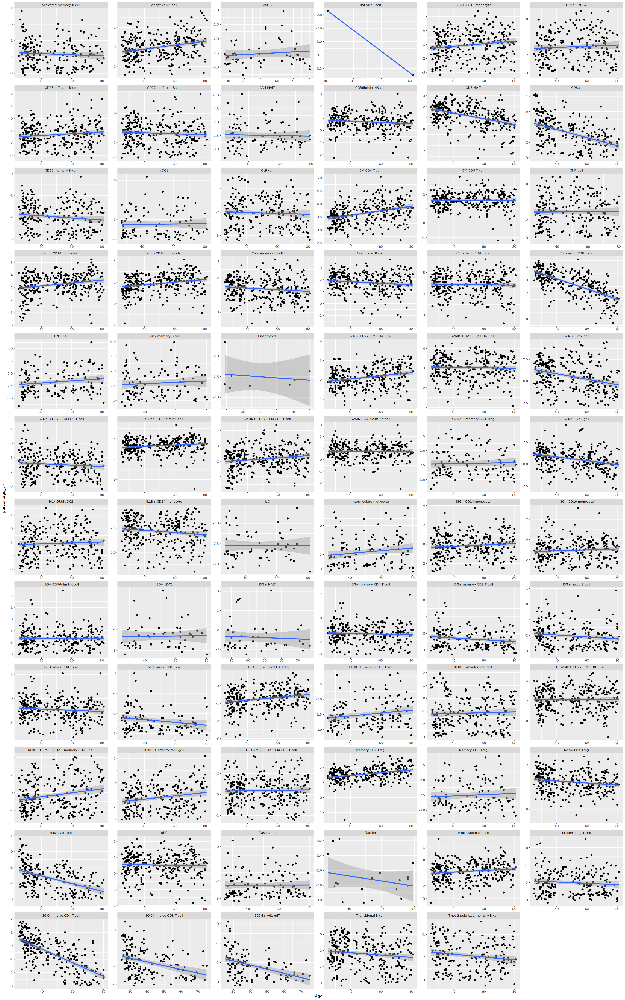

In [35]:
options(repr.plot.width = 25, repr.plot.height = 40)

ggplot(AIFI_L3_freq, aes(x = Age, y = percentage_clr)) +
  geom_point() +
  stat_smooth(method='lm')+facet_wrap(~AIFI_L3,scale='free',ncol=6)

`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“at  30.85”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“radius  0.0225”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“all data on boundary of neighborhood. make span bigger”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at 30.85”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 0.15”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  1”
Warning message in simpleLoess(y, x, w, span, degree = degree, paramet

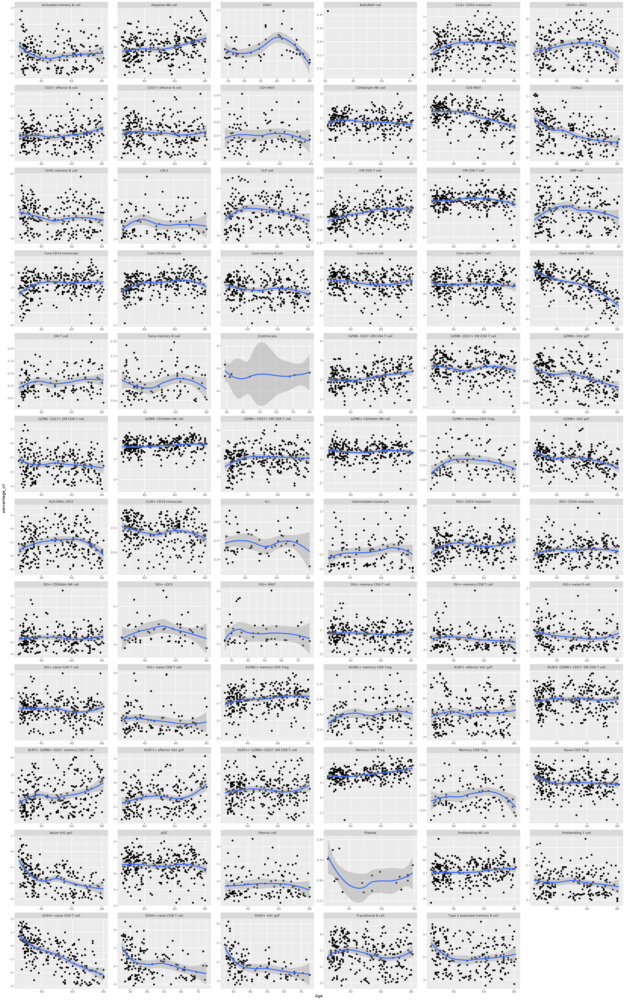

In [36]:
options(repr.plot.width = 25, repr.plot.height = 40)

ggplot(AIFI_L3_freq, aes(x = Age, y = percentage_clr)) +
  geom_point() +
  stat_smooth()+facet_wrap(~AIFI_L3,scale='free',ncol=6)

# Align with our data

In [69]:
BRI<-read.csv('/home/jupyter/BRI_Figures_Final_V2/Dataset/diha_AIFI_L3_frequencies_2024-05-05.csv') %>% filter(sample.visitName=='Flu Year 1 Day 0')

In [70]:
SF4<-read.csv('/home//jupyter/BRI_Figures_Final_V2/Figure2/03_Get_Counts/SF4_AIFI_L3_Counts.csv')

In [71]:
SF4<-SF4%>% 
  group_by(pbmc_sample_id)%>% 
  dplyr::mutate(percentage=count/sum(count),
               percentage_clr=clr_transform(percentage)) %>% ungroup()

In [73]:
BRI<-BRI[c("subject.subjectGuid","AIFI_L3",'AIFI_L3_clr',"subject.ageAtFirstDraw")]

In [75]:
meta_data=read.csv("/home/jupyter/BRI_Figures_Final_V2/Dataset/SF4_meta_data-2024-05-05.csv")
meta_data$ageAtEnrollment[meta_data$ageAtEnrollment == '89+'] <- '90'
meta_data$ageAtEnrollment<-as.numeric(meta_data$ageAtEnrollment)
meta_data<-meta_data[!is.na(meta_data$ageAtEnrollment),]
meta_data$Ages<-meta_data$ageAtEnrollment
meta_data <- meta_data[!duplicated(meta_data$sample.sampleKitGuid, fromLast = TRUE), ]
meta_data$CMV<-meta_data$lab.revisionHistory.dataHistory.CMV.Ab.Screen.Result..CMVRES..newValue

In [76]:
SF4<-left_join(SF4,meta_data,by="pbmc_sample_id")

In [78]:
SF4<-SF4[c("subject.subjectGuid","celltypist_l3",'percentage_clr',"ageAtEnrollment")]

In [79]:
colnames(BRI)<-c("sample_id","AIFI_L3",'percentage_clr',"Age")
colnames(SF4)<-c("sample_id","AIFI_L3",'percentage_clr',"Age")

In [81]:
AIFI_L3_freq$sample_id<-paste0(AIFI_L3_freq$Donor_id,"-",AIFI_L3_freq$Age)

In [83]:
AIFI_L3_freq=AIFI_L3_freq[c("sample_id","AIFI_L3",'percentage_clr',"Age")]

In [84]:
AIFI_L3_freq$Dataset<-"Maxim"
SF4$Dataset<-"SF4"


In [98]:
BRI<-BRI %>% 
  mutate(
    Dataset = case_when(
      str_starts(sample_id, "BR1") ~ "BR1",
      str_starts(sample_id, "BR2") ~ "BR2",
    )
  )

In [100]:
df<-do.call(rbind,list(BRI,SF4,AIFI_L3_freq))

`geom_smooth()` using formula = 'y ~ x'
Warning message in qt((1 - level)/2, df):
“NaNs produced”
Warning message in max(ids, na.rm = TRUE):
“no non-missing arguments to max; returning -Inf”


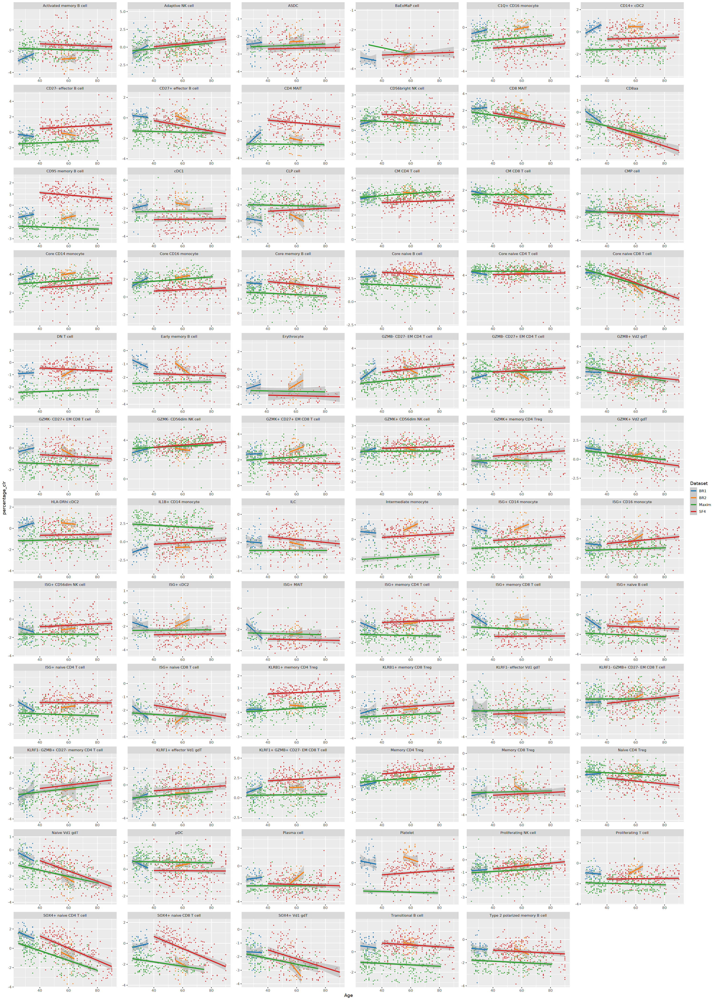

In [105]:
options(repr.plot.width = 25, repr.plot.height = 35)

ggplot(df, aes(x = Age, y = percentage_clr,group=Dataset,color=Dataset)) +
  geom_point(size=0.1) +
  stat_smooth(method='lm')+
facet_wrap(~AIFI_L3,scale='free',ncol=6)+
scale_color_d3()